In [1]:
import cv2
import numpy as np

def load_image(path: str) -> np.ndarray:
    image_path = cv2.samples.findFile(path)
    return cv2.imread(image_path)


napoleon = load_image("../assets/napoleon.jpg")
napoleon_face = load_image("../assets/napoleon_face.png")
napoleon_belt = load_image("../assets/napoleon_belt.png")

print(napoleon.shape)
print(napoleon_face.shape)
print(napoleon_belt.shape)


(1205, 800, 3)
(240, 244, 3)
(240, 424, 3)


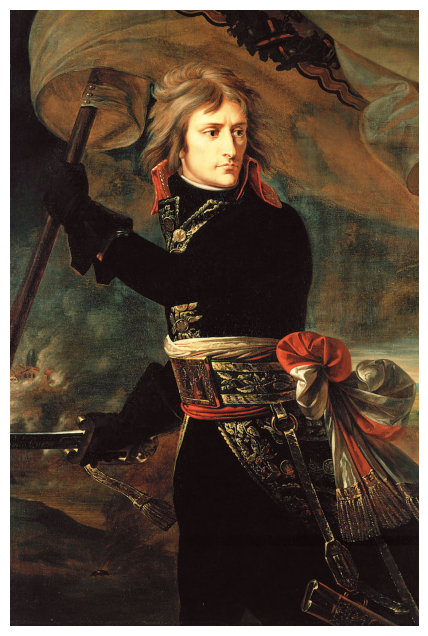

In [2]:
import matplotlib.pyplot as plt

napoleon_rgb = cv2.cvtColor(napoleon, cv2.COLOR_BGR2RGB)

# Display the image using matplotlib
plt.figure(figsize=(10, 8))
plt.imshow(napoleon_rgb)
plt.axis('off')  # Hide axes
plt.show()

In [3]:
def show_image_region(box: tuple[int, int, int, int]):
    x, y, w, h = box
    face_region = napoleon[y:y+h, x:x+w]

    # Convert to RGB for display
    face_region_rgb = cv2.cvtColor(face_region, cv2.COLOR_BGR2RGB)

    # Display the extracted face region
    plt.figure(figsize=(5, 5))
    plt.imshow(face_region_rgb)
    plt.axis('off')
    plt.show()


(231, 90, 305, 300)


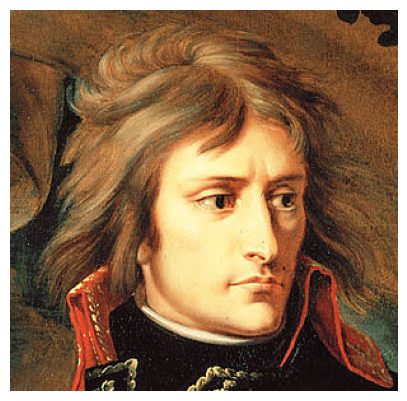

In [4]:
from sift_image_searcher import SiftImageSearcher

sift_matching = SiftImageSearcher()

sift_face_box = sift_matching.find_image(napoleon, napoleon_face)
print(sift_face_box)

show_image_region(sift_face_box)

(171, 587, 531, 299)


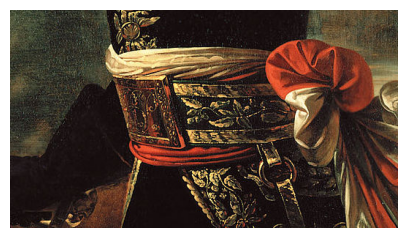

In [5]:
sift_belt_box = sift_matching.find_image(napoleon, napoleon_belt)
print(sift_belt_box)

show_image_region(sift_belt_box)


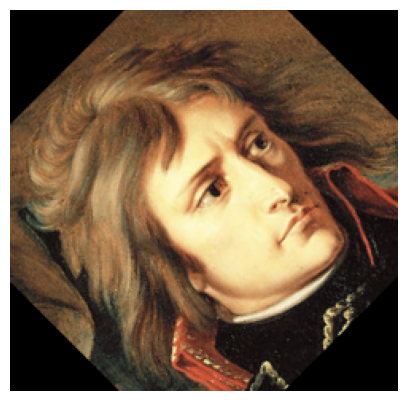

In [6]:
# Rotate napoleon face by 45 degrees
import cv2

# Get center of image for rotation
height, width = napoleon_face.shape[:2]
center = (width // 2, height // 2)

# Create rotation matrix
angle = 45
rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)

# Perform rotation
rotated_face = cv2.warpAffine(napoleon_face, rotation_matrix, (width, height))

# Display rotated face
plt.figure(figsize=(5, 5))
plt.imshow(cv2.cvtColor(rotated_face, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()



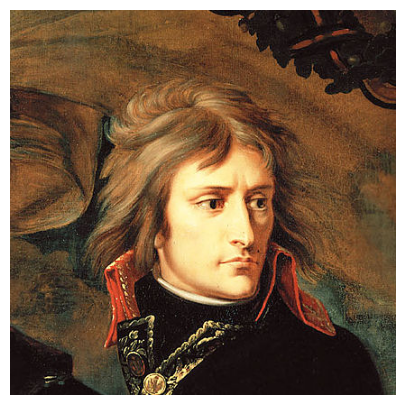

In [7]:
sift_rotated_box = sift_matching.find_image(napoleon, rotated_face)

show_image_region(sift_rotated_box)

In [8]:
template_matching = TemplateImageSearcher(step=10, threshold=1.0)

template_rotated_box = template_matching.find_image(napoleon, rotated_face)

if template_rotated_box is not None:
    show_image_region(template_rotated_box)
else:
    print("Template matching did not find rotated face")


NameError: name 'TemplateImageSearcher' is not defined

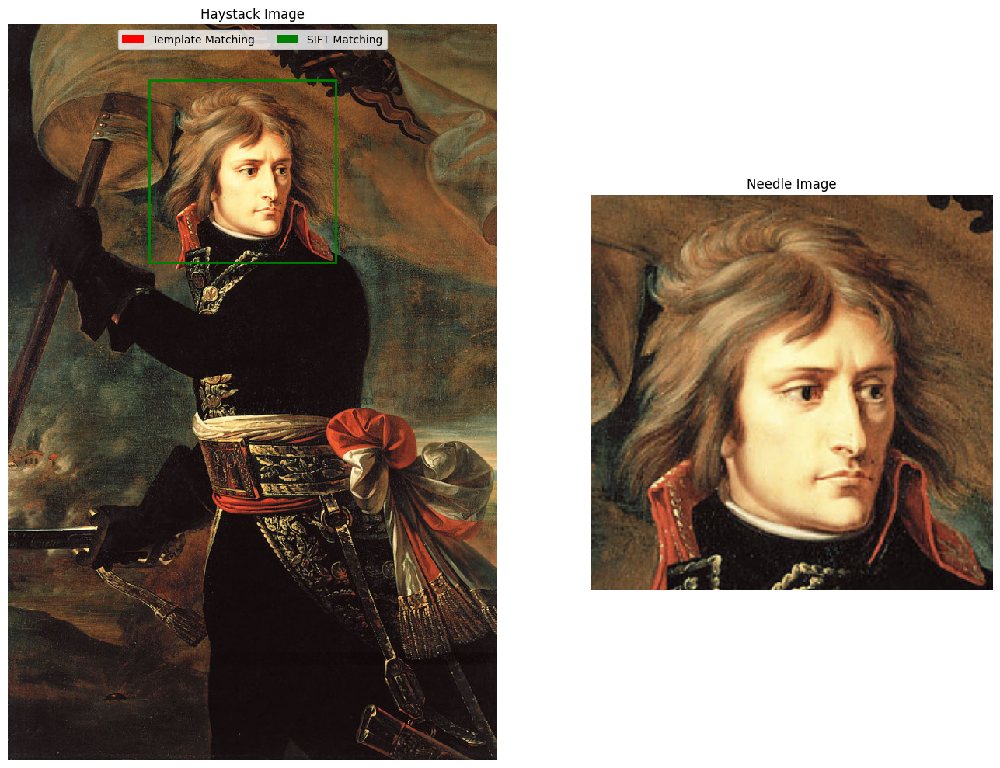

In [14]:
def compare_matching_results(
        haystack_image: np.ndarray, 
        needle_image: np.ndarray, 
        template_box: tuple[int, int, int, int] | None,
        sift_box: tuple[int, int, int, int] | None
):
    # Convert images to RGB for display
    haystack_rgb = cv2.cvtColor(haystack_image, cv2.COLOR_BGR2RGB)
    needle_rgb = cv2.cvtColor(needle_image, cv2.COLOR_BGR2RGB)
    
    # Create figure with 1 row and 2 columns
    fig, axs = plt.subplots(1, 2, figsize=(15, 10), width_ratios=[2, 1])

    # First row: Original image and template
    axs[0].imshow(haystack_rgb)
    axs[0].set_title('Haystack Image')
    axs[0].axis('off')
    
    # Draw bounding boxes if available
    if template_box is not None:
        x, y, w, h = template_box
        rect = plt.Rectangle((x, y), w, h, linewidth=2, edgecolor='r', facecolor='none')
        axs[0].add_patch(rect)
    
    if sift_box is not None:
        x, y, w, h = sift_box
        rect = plt.Rectangle((x, y), w, h, linewidth=2, edgecolor='g', facecolor='none')
        axs[0].add_patch(rect)
    
    axs[1].imshow(needle_rgb)
    axs[1].set_title('Needle Image')
    axs[1].axis('off')
    
    # Add legend
    red_patch = plt.Rectangle((0, 0), 1, 1, fc="r")
    green_patch = plt.Rectangle((0, 0), 1, 1, fc="g")

    axs[0].legend([red_patch, green_patch], ['Template Matching', 'SIFT Matching'], loc='upper center', ncol=2)
    
    plt.tight_layout()
    plt.show()


compare_matching_results(napoleon, napoleon_face, None, sift_face_box)


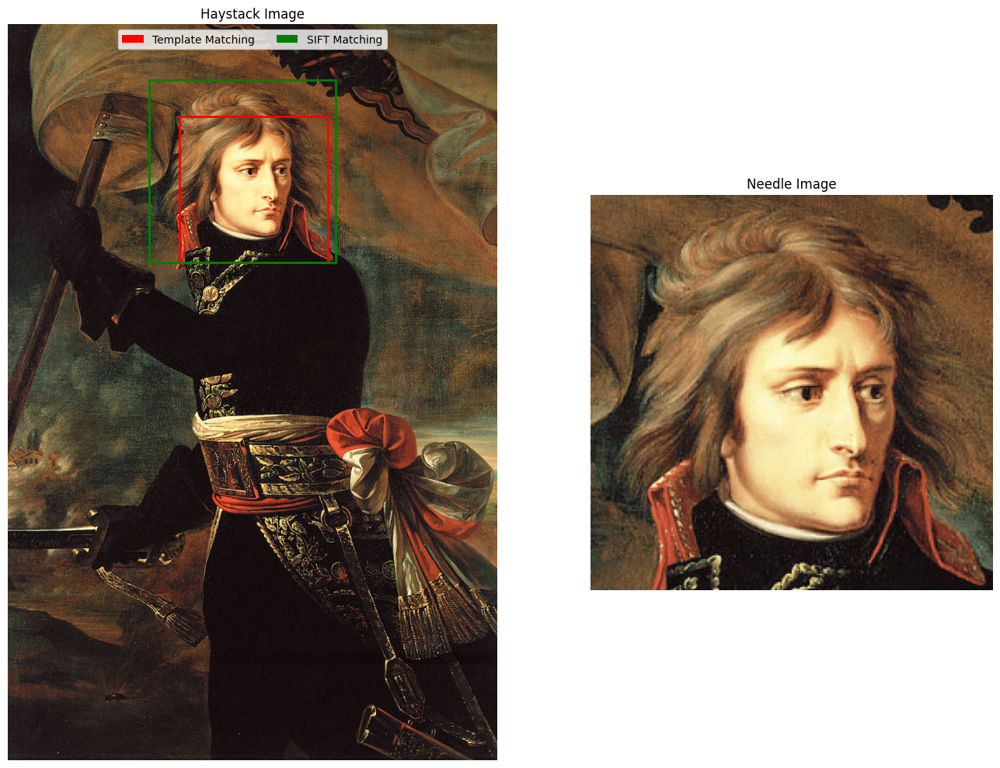

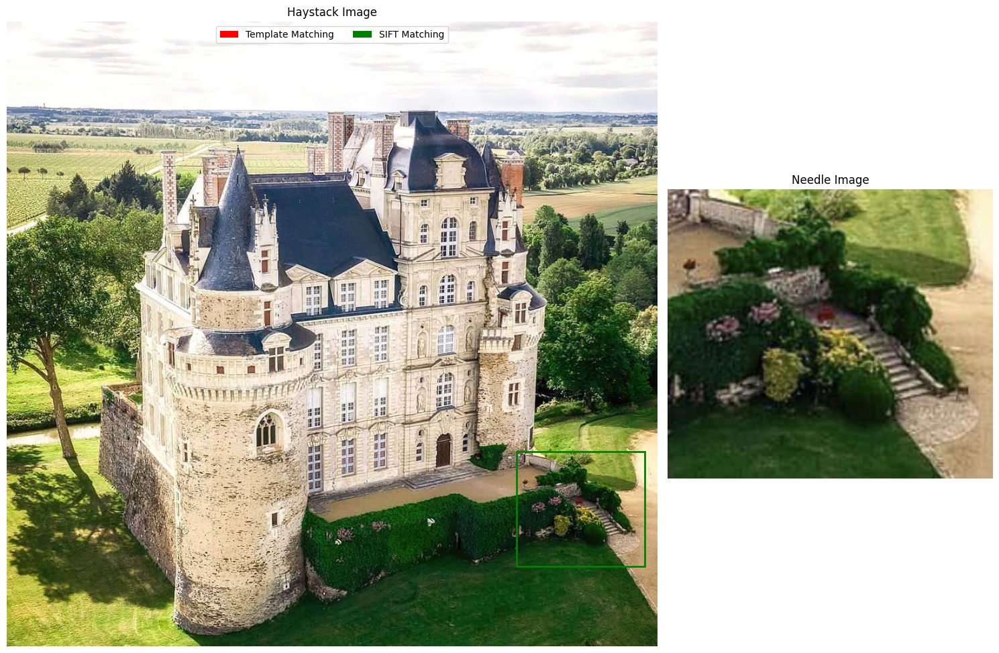

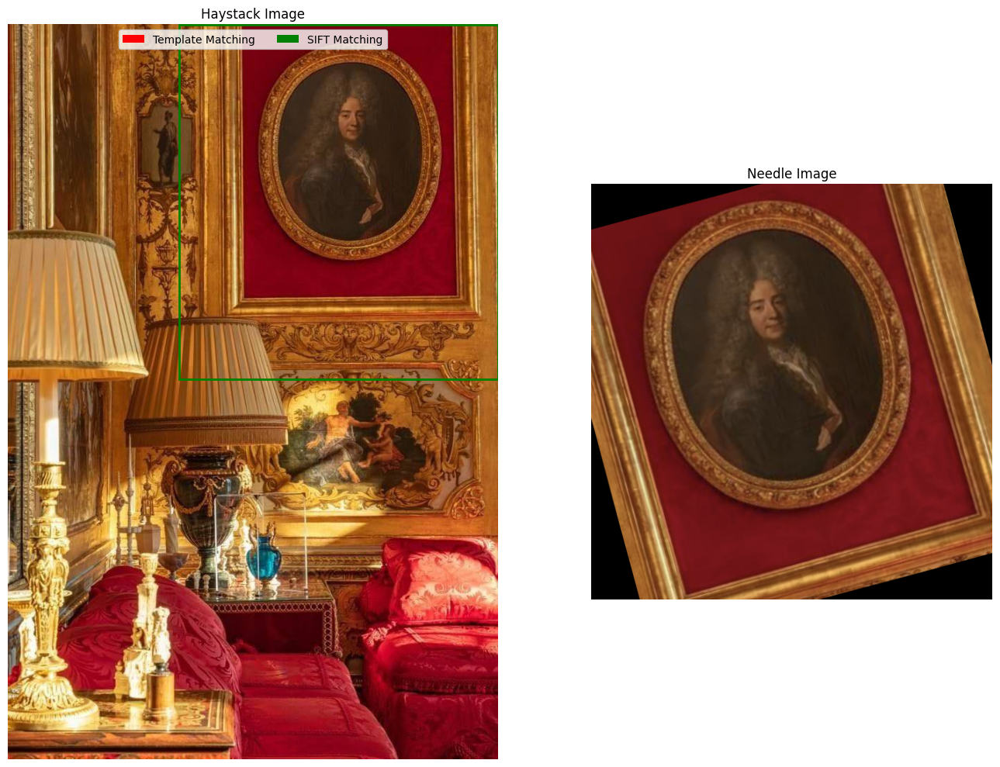

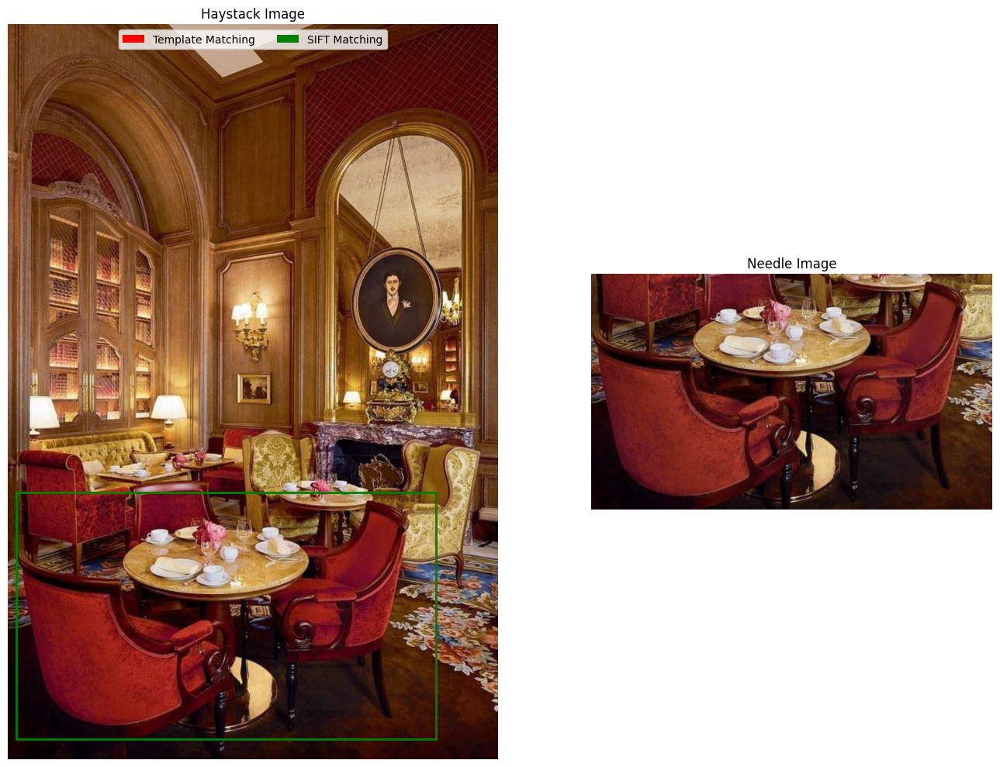

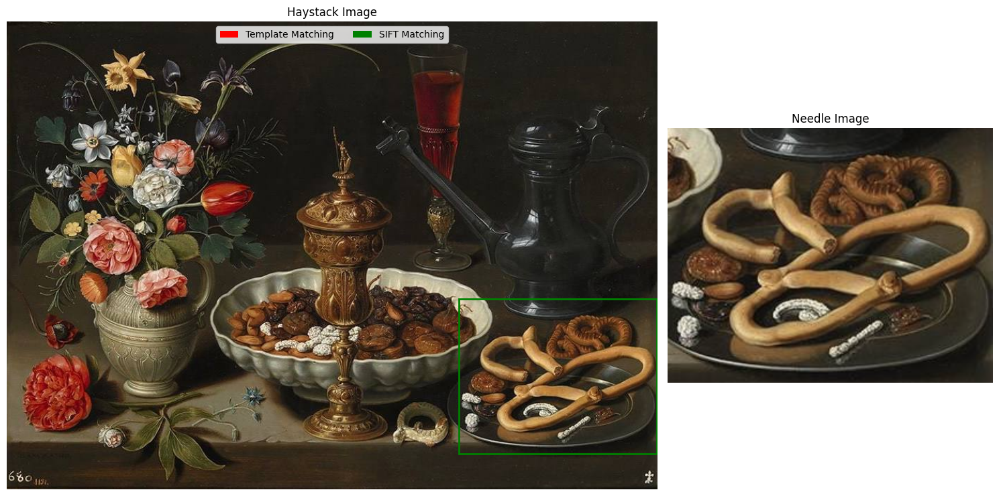

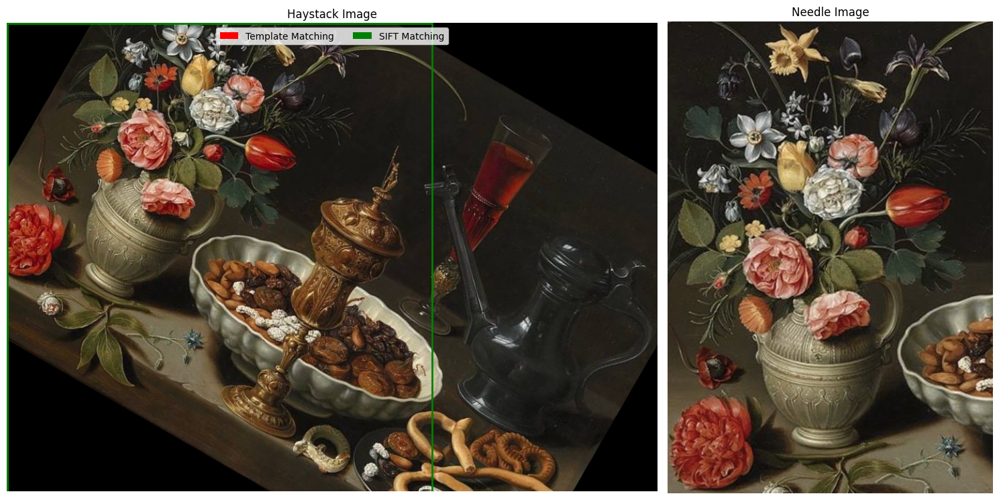

In [15]:
# Load test images
napoleon = cv2.imread("../assets/napoleon.jpg")
napoleon_face = cv2.imread("../assets/napoleon_face.png")
napoleon_belt = cv2.imread("../assets/napoleon_belt.png")
castle = cv2.imread('../assets/castle.jpg')
castle_stairs = cv2.imread('../assets/castle_stairs.png')
interior = cv2.imread('../assets/interior.jpg')
interior_portrait = cv2.imread('../assets/interior_portrait.png')
restaurant = cv2.imread('../assets/restaurant.jpg')
restaurant_table = cv2.imread('../assets/restaurant_table.png')
table = cv2.imread('../assets/table.jpg')
table_cookies = cv2.imread('../assets/table_cookies.png')
table_flowers = cv2.imread('../assets/table_flowers.png')

# Create SIFT searcher
sift_searcher = SiftImageSearcher()
template_searcher = TemplateImageSearcher(step=10, threshold=1.0)

# Test cases with rotation and scaling
def rotate_image(image, angle):
    height, width = image.shape[:2]
    center = (width/2, height/2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    return cv2.warpAffine(image, rotation_matrix, (width, height))

def scale_image(image, scale):
    width = int(image.shape[1] * scale)
    height = int(image.shape[0] * scale)
    return cv2.resize(image, (width, height))

# Test case 0: Napoleon face in napoleon
napoleon_face_box_sift = sift_searcher.find_image(napoleon, napoleon_face)
napoleon_face_box_template = TemplateImageSearcher(step=10, threshold=2.0).find_image(napoleon, napoleon_face)
compare_matching_results(napoleon, napoleon_face, napoleon_face_box_template, napoleon_face_box_sift)

# Test case 1: Castle stairs in castle
castle_stairs_box_sift = sift_searcher.find_image(castle, castle_stairs)
castle_stairs_box_template = template_searcher.find_image(castle, castle_stairs)
compare_matching_results(castle, castle_stairs, castle_stairs_box_template, castle_stairs_box_sift)

# Test case 2: Interior and rotated portrait
rotated_portrait = rotate_image(interior_portrait, 15)
interior_portrait_box_sift = sift_searcher.find_image(interior, rotated_portrait)
interior_portrait_box_template = template_searcher.find_image(interior, rotated_portrait)
compare_matching_results(interior, rotated_portrait, interior_portrait_box_template, interior_portrait_box_sift)

# Test case 3: Restaurant table in restaurant (with scaling)
scaled_restaurant = scale_image(restaurant, 1.5)
restaurant_table_box_sift = sift_searcher.find_image(scaled_restaurant, restaurant_table)
restaurant_table_box_template = template_searcher.find_image(scaled_restaurant, restaurant_table)
compare_matching_results(scaled_restaurant, restaurant_table, restaurant_table_box_template, restaurant_table_box_sift)

# Test case 4: Table cookies on table
table_cookies_box_sift = sift_searcher.find_image(table, table_cookies)
table_cookies_box_template = template_searcher.find_image(table, table_cookies)
compare_matching_results(table, table_cookies, table_cookies_box_template, table_cookies_box_sift)

# Test case 5: Table flowers on table (with rotation)
rotated_table = rotate_image(table, -30)
table_flowers_box_sift = sift_searcher.find_image(rotated_table, table_flowers)
table_flowers_box_template = template_searcher.find_image(rotated_table, table_flowers)
compare_matching_results(rotated_table, table_flowers, table_flowers_box_template, table_flowers_box_sift)
